In [1]:
import cv2

from dust3r.inference import inference
from dust3r.model import AsymmetricCroCo3DStereo
from dust3r.utils.image import load_images
from dust3r.image_pairs import make_pairs

from PIL import Image
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import math
import torch


/home/lab/micromamba/envs/dust3r/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = 'cuda'
batch_size = 1
schedule = 'cosine'
lr = 0.01
niter = 300

model_name = "naver/DUSt3R_ViTLarge_BaseDecoder_512_dpt"
# you can put the path to a local checkpoint in model_name if needed
model = AsymmetricCroCo3DStereo.from_pretrained(model_name).to(device)

# a dict to store the activations
# trying to add hooks on the attention layers    
activation = {}
def getActivation(name):
    # the hook signature
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook


proj_k_1 = []
proj_q_1 = []

proj_k_2 = []
proj_q_2 = []

for i in range(12):
    proj_k_1.append(model.dec_blocks[i].cross_attn.register_forward_hook(getActivation('projq1_'+str(i))))
    proj_q_1.append(model.dec_blocks[i].cross_attn.register_forward_hook(getActivation('projk1_'+str(i))))

for i in range(12):
    proj_k_2.append(model.dec_blocks2[i].cross_attn.register_forward_hook(getActivation('projq2_'+str(i))))
    proj_q_2.append(model.dec_blocks2[i].cross_attn.register_forward_hook(getActivation('projk2_'+str(i))))

# load_images can take a list of images or a directory
images = load_images(['croco/assets/Chateau1.png', 'croco/assets/Chateau2.png'], size=512)
pairs = make_pairs(images, scene_graph='complete', prefilter=None, symmetrize=True)
output = inference(pairs, model, device, batch_size=batch_size)



>> Loading a list of 2 images
 - adding croco/assets/Chateau1.png with resolution 224x224 --> 512x384
 - adding croco/assets/Chateau2.png with resolution 224x224 --> 512x384
 (Found 2 images)
>> Inference with model on 2 image pairs


  0%|          | 0/2 [00:00<?, ?it/s]

ATTENTION intrinsics are not being used
ATTENTION extrinsics are not being used


/home/lab/Documents/scsv/thesis/dust3r_mine/dust3r/inference.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=bool(use_amp)):
/home/lab/Documents/scsv/thesis/dust3r_mine/dust3r/model.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/home/lab/Documents/scsv/thesis/dust3r_mine/dust3r/inference.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

ATTENTION intrinsics are not being used
ATTENTION extrinsics are not being used


In [3]:
cross_attentions_1 = []
cross_attentions_2 = []

for i in range(12):
    projq = activation['projq1_'+str(i)]
    projk = activation['projk1_'+str(i)]
    B, N, C = projq.shape
    num_heads = 8
    d_k = C // num_heads
    q = projq.view(B, N, num_heads, d_k).permute(0, 2, 1, 3)
    k = projk.view(B, N, num_heads, d_k).permute(0, 2, 1, 3)

    attention = torch.matmul(q, k.transpose(2,3))
    attention = torch.nn.functional.softmax(attention / math.sqrt(d_k), dim=-1)
    cross_attentions_1.append(attention)

cross_attentions_1 = torch.stack(cross_attentions_1, dim=0).to('cpu').detach().numpy()

for i in range(12):
    projq = activation['projq2_'+str(i)]
    projk = activation['projk2_'+str(i)]
    B, N, C = projq.shape
    num_heads = 8
    d_k = C // num_heads
    q = projq.view(B, N, num_heads, d_k).permute(0, 2, 1, 3)
    k = projk.view(B, N, num_heads, d_k).permute(0, 2, 1, 3)

    attention = torch.matmul(q, k.transpose(2,3))
    attention = torch.nn.functional.softmax(attention / math.sqrt(d_k), dim=-1)
    cross_attentions_2.append(attention)

cross_attentions_2 = torch.stack(cross_attentions_2, dim=0).to('cpu').detach().numpy()

In [4]:
cross_attentions_2.device

'cpu'

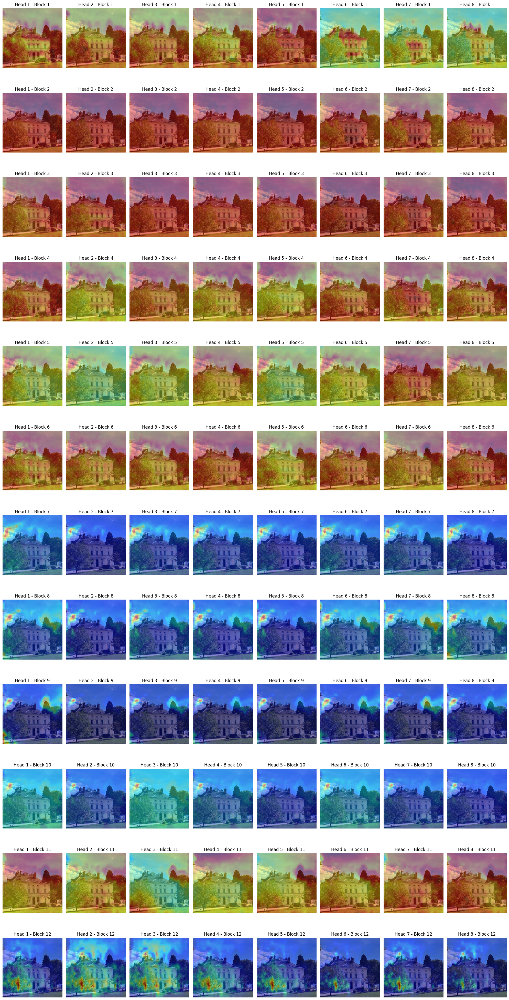

In [4]:
plt.figure(figsize=(20, 40))  # Set the figure size (width, height)

for block_idx in range(12):

    for head_idx in range(8):
        attention_matrix = cross_attentions_2[block_idx, 0, head_idx]  # Extract attention for the head
        grid_height, grid_width, num_patches = 24, 32, 768
        assert grid_height * grid_width == num_patches, "Grid dimensions mismatch."
        attention_grid = attention_matrix.reshape(grid_height, grid_width, grid_height, grid_width)
        aggregated_attention = attention_grid.sum(axis=(0, 1)) / attention_grid.sum(axis=(0, 1)).max()

        image_path = 'croco/assets/Chateau2.png'
        image = np.array(Image.open(image_path).convert('RGB'))
        attention_resized = cv2.resize(aggregated_attention, (image.shape[1], image.shape[0]))
        attention_colored = cv2.cvtColor(cv2.applyColorMap(np.uint8(255 * attention_resized), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        overlayed_image = cv2.addWeighted(image, 0.6, attention_colored, 0.4, 0)

        plt.subplot(12, 8, block_idx * 8 + head_idx + 1)
        plt.imshow(overlayed_image)
        plt.title(f'Head {head_idx + 1} - Block {block_idx + 1}')
        plt.axis('off')

plt.tight_layout()
plt.show()


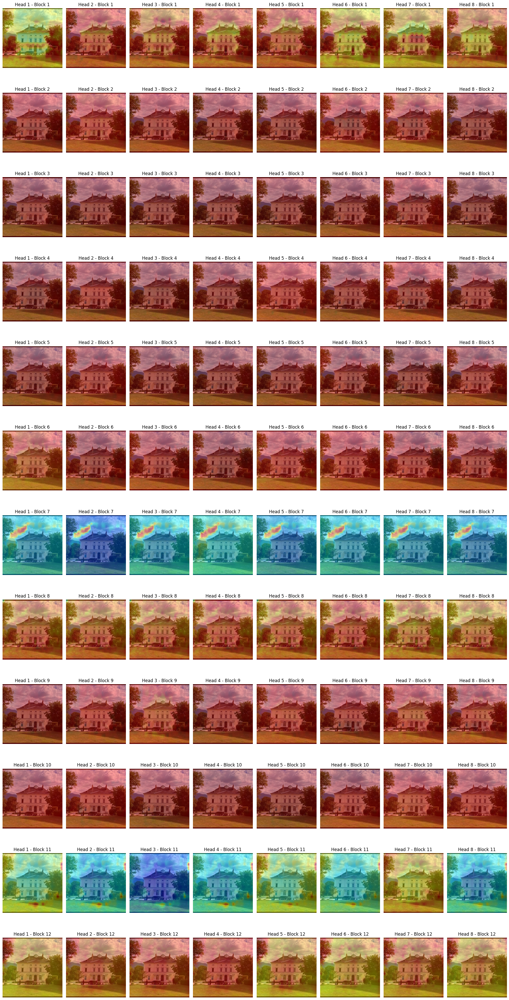

In [5]:
plt.figure(figsize=(20, 40))  # Set the figure size (width, height)

for block_idx in range(12):

    for head_idx in range(8):
        attention_matrix = cross_attentions_1[block_idx, 0, head_idx]  # Extract attention for the head
        grid_height, grid_width, num_patches = 24, 32, 768
        assert grid_height * grid_width == num_patches, "Grid dimensions mismatch."
        attention_grid = attention_matrix.reshape(grid_height, grid_width, grid_height, grid_width)
        aggregated_attention = attention_grid.sum(axis=(0, 1)) / attention_grid.sum(axis=(0, 1)).max()

        image_path = 'croco/assets/Chateau1.png'
        image = np.array(Image.open(image_path).convert('RGB'))
        attention_resized = cv2.resize(aggregated_attention, (image.shape[1], image.shape[0]))
        attention_colored = cv2.cvtColor(cv2.applyColorMap(np.uint8(255 * attention_resized), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        overlayed_image = cv2.addWeighted(image, 0.6, attention_colored, 0.4, 0)

        plt.subplot(12, 8, block_idx * 8 + head_idx + 1)
        plt.imshow(overlayed_image)
        plt.title(f'Head {head_idx + 1} - Block {block_idx + 1}')
        plt.axis('off')

plt.tight_layout()
plt.show()
